In [2]:
import sentiment_analysis_functions as saf
import lda as lda
import pandas as pd
import matplotlib.pyplot as plt
import re
import nltk
from textblob import TextBlob
import numpy as np
from pycontractions import Contractions
cont = Contractions(api_key="glove-twitter-25")
cont.load_models()
dir = "/volumes/Hayley's Drive/PycharmProjects/twilightvalefalls/"

/Users/homeworkdude/anaconda3/envs/nlp2/lib/python3.6/site-packages/smart_open/smart_open_lib.py:160: DeprecationWarning: inspect.getargspec() is deprecated since Python 3.0, use inspect.signature() or inspect.getfullargspec()
  args, varargs, keywords, defaults = inspect.getargspec(kallable)


In [3]:
gf_sa_test = pd.read_csv(dir + 'gravityfalls/gf_eps.csv', sep='|', index_col=0)

In [4]:
titles = gf_sa_test['title']
epis = gf_sa_test['text']
gfsa = saf.sentiment_analysis(dir + 'named_entities_all/gravity_falls_ner.txt')
gfsa_dict = dict()

for i,g in enumerate(epis):
    gfsa_dict[titles[i]] = gfsa.story_analysis(g)

[[('episode', 'NN'), ('opens', 'NNS')], [('sun', 'NN'), ('dipper', 'NE::CHR:DPines')], [('dipper', 'NE::CHR:DPines'), ('starts', 'NNS')], [('narrate', 'JJ'), ('dipper', 'NE::CHR:DPines')], [('dipper pines', 'NE::CHR:DPines')], [('pines', 'NNS'), ('narrating', 'VBG')], [('narrating', 'VBG'), ('ah', 'NN')], [('ah', 'NN'), ('summer', 'NN')], [('summer', 'NN'), ('break', 'NN')], [('camera', 'NN'), ('pans', 'NNS')], [('hank', 'NE::CHR:Hank'), ('grilling', 'VBG')], [('grilling', 'VBG'), ('burgers', 'NNS')], [('running', 'VBG'), ('around', 'RB')], [('around', 'IN'), ('beside', 'RB')], [('others', 'NNS'), ('sit', 'VBP')], [('picnic', 'NN'), ('table', 'NN')], [('table', 'JJ'), ('hank', 'NE::CHR:Hank')], [('want', 'VB'), ('cheese', 'NN')], [('hon', 'NN'), ('hank', 'NE::CHR:Hank')], [('hank', 'NE::CHR:Hank'), ("'s", 'POS')], [("'s", 'POS'), ('wife', 'NN')], [('wife', 'NN'), ('sure', 'NN')], [('sure', 'JJ'), ('hank', 'NE::CHR:Hank')], [('hank', 'NE::CHR:Hank'), ('dipper', 'NE::CHR:DPines')], [('le

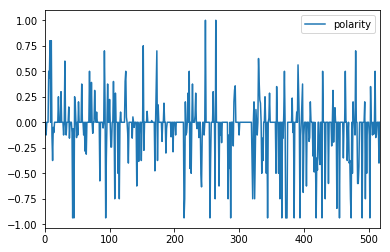

In [4]:
gfsa_dict.get('Tourist Trapped')[1].plot(y='polarity', use_index=True)

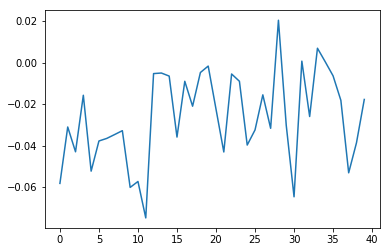

In [5]:
avg_polarity_epi = list()
for entry in gfsa_dict:
    avg_polarity_epi.append(gfsa_dict.get(entry)[1]['polarity'].mean(axis=0))
plt.plot(range(0,40),avg_polarity_epi)

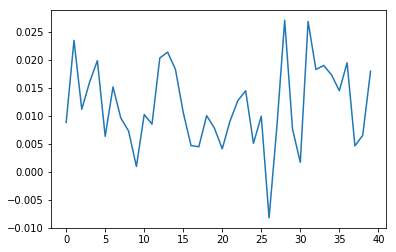

In [6]:
avg_polarity_epi_bg = list()
for entry in gfsa_dict:
    avg_polarity_epi_bg.append(gfsa_dict.get(entry)[0]['polarity'].mean(axis=0))
plt.plot(range(0,40),avg_polarity_epi_bg)

In [7]:
concat_epis = ' '.join(epis)
cebf, cesf = gfsa.story_analysis(concat_epis)

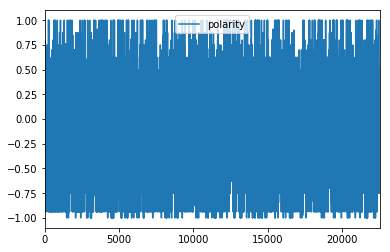

In [8]:
cesf.groupby(np.arange(len(cesf))//10).mean().plot(y='polarity', use_index=True)
